In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import scvi
import math
import matplotlib.pyplot as plt
import scipy.sparse
from glob import glob
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression

%matplotlib inline

Global seed set to 0


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.2 numpy==1.21.6 scipy==1.9.0 pandas==1.4.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


In [5]:
radhika_adata = sc.read_h5ad("/project2/gilad/rjangi1/ebQTL/trajectories/cardiomyocytes/data/anndata_objects/fdr01_2nd_cmstages.h5ad")

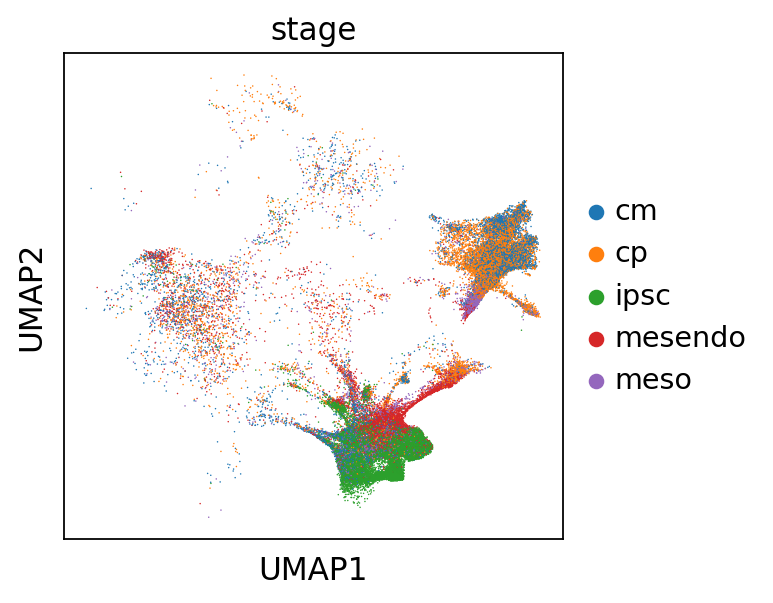

In [7]:
sc.pl.umap(radhika_adata, color=["stage"])

## Filter Samples

How many cells do we have for each individual in each cell type?

In [11]:
cell_counts = radhika_adata.obs[['donor_id_x', 'stage']]
cell_counts = pd.DataFrame(cell_counts.groupby('stage').value_counts()).reset_index(inplace=False).rename(columns={0: "n_cells_unfiltered", 'stage': 'type'})
cell_counts

,type,donor_id_x,n_cells_unfiltered
0,cm,NA19160,950
1,cm,NA18912,813
2,cm,NA19093,759
3,cm,NA18907,593
4,cm,NA18489,504
...,...,...,...
250,meso,NA19128,2
251,meso,NA19101,2
252,meso,NA19209,0
253,meso,NA19190,0


To get this into proper form, we need to:
- Reformat cell types

In [12]:
cell_counts['individual'] = [s.replace("NA", "") for s in cell_counts['donor_id_x']]
cell_counts['ind_type'] = cell_counts['individual'].astype(str) + "_" + cell_counts['type'].astype(str)
cell_counts = cell_counts[['ind_type', 'individual', 'type', 'n_cells_unfiltered']]
cell_counts

,ind_type,individual,type,n_cells_unfiltered
0,19160_cm,19160,cm,950
1,18912_cm,18912,cm,813
2,19093_cm,19093,cm,759
3,18907_cm,18907,cm,593
4,18489_cm,18489,cm,504
...,...,...,...,...
250,19128_meso,19128,meso,2
251,19101_meso,19101,meso,2
252,19209_meso,19209,meso,0
253,19190_meso,19190,meso,0


We'll drop any samples with less than 5 cells

In [13]:
cell_counts['dropped'] = cell_counts['n_cells_unfiltered'] < 5

## Filter Cell Types

We will filter to samples with at least 5 cells, and cell types with over 25 individuals represented.

In [14]:
ind_counts = cell_counts[cell_counts['n_cells_unfiltered'] >= 5]
ind_counts = pd.DataFrame(ind_counts[['type']].value_counts()).reset_index(inplace=False).rename(columns={0: "n_unfiltered"})
ind_counts = ind_counts[ind_counts['n_unfiltered']>25]
ind_counts

,type,n_unfiltered
0,cm,50
1,cp,50
2,mesendo,45
3,meso,45
4,ipsc,41


In [16]:
ind_counts.to_csv("/project2/gilad/jpopp/ebQTL/data/static/cm_lineage/pseudobulk_scran/samples_per_celltype.tsv",
                  sep="\t", index=False)
ind_counts.to_csv("/project2/gilad/jpopp/ebQTL/data/static/cm_lineage/pseudobulk_tmm/samples_per_celltype.tsv",
                  sep="\t", index=False)

## Load Raw Data

First, we can highlight which samples will be kept for QTL analysis

In [17]:
cell_types_inc = ind_counts['type']
samples_inc = cell_counts[(cell_counts['dropped'] == False) & (cell_counts['type'].isin(cell_types_inc))]['ind_type']

In [18]:
cell_subset = radhika_adata.obs[['donor_id_x']]
cell_subset['type'] = radhika_adata.obs[['stage']]
cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id_x'].astype(str)]
cell_subset['sample'] = cell_subset['ind'] + "_" + cell_subset['type']
cell_subset = cell_subset[cell_subset['sample'].isin(samples_inc)]
cell_subset

/tmp/jobs/23172908/ipykernel_172327/2253161530.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['type'] = radhika_adata.obs[['stage']]
/tmp/jobs/23172908/ipykernel_172327/2253161530.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id_x'].astype(str)]
/tmp/jobs/23172908/ipykernel_172327/2253161530.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,c

,donor_id_x,type,ind,sample
cell,,,,
TCGTGGGTCCGCTGTT-91,NA18486,cm,18486,18486_cm
TGTTCATAGCGTCTCG-21,NA18907,ipsc,18907,18907_ipsc
AGCTTCCGTTGTTGAC-50,NA18855,meso,18855,18855_meso
AAGAACATCAAGGCTT-40,NA19093,cm,19093,19093_cm
GCAACATCAGAAGCGT-31,NA19153,ipsc,19153,19153_ipsc
...,...,...,...,...
AATTTCCAGGACAGCT-49,NA18507,ipsc,18507,18507_ipsc
TTACCGCGTGAGTCAG-78,NA18862,meso,18862,18862_meso
CAGCAATCACTCCGGA-34,NA18856,mesendo,18856,18856_mesendo


For pseudobulk aggregation, we're going to use the scran-normalized data

In [19]:
scran_adata = sc.read_h5ad("/project2/gilad/ktayeb/ebqtl-workflowr/output/proc/EB_high_pass_filtered_normalized.h5ad")

In [20]:
scran_adata = scran_adata[cell_subset.index]

In [31]:
scran_adata.obs['stage'] = radhika_adata.obs['stage']

In [21]:
scran_adata.layers['data'] = scran_adata.X

Remove parts of this anndata object that are no longer necessary

In [22]:
del scran_adata.uns
del scran_adata.obsm
del scran_adata.varm
del scran_adata.obsp

Get raw counts from the scran-normalized data

In [23]:
adj_counts = scipy.sparse.csr_matrix.expm1(scran_adata.X)
size_factors = np.array(scran_adata.obs['sizeFactor'])
raw_counts = np.rint(adj_counts.transpose().multiply(size_factors).toarray()).transpose()
scran_adata.layers['counts'] = raw_counts
scran_adata.X = raw_counts

## Filter Cells by Cell Type

### Lineage-wide metrics

In [24]:
scran_adata.var['mt'] = scran_adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(scran_adata, qc_vars=['mt'], inplace=True)

Text(0.5, 1.0, 'N Genes By Counts')

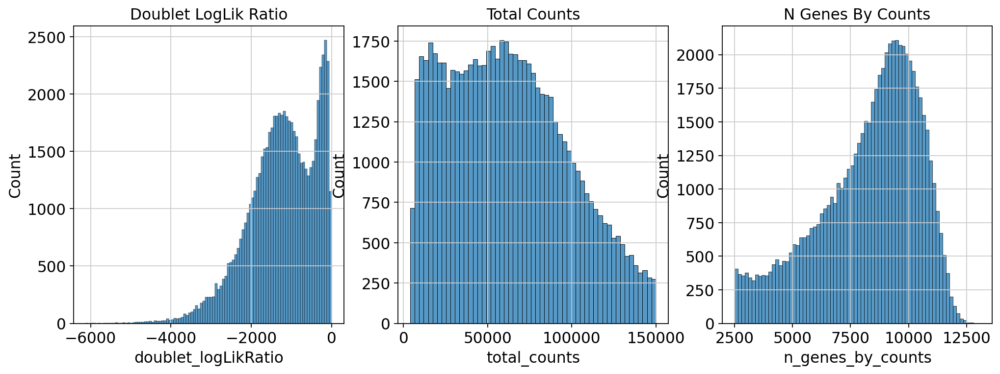

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=scran_adata.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=scran_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=scran_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

In [44]:
pluripotency_genes = ['POU5F1', 'NANOG', 'GAL', 'UTF1', 'GDF3', 
                      'FGF4', 'LIN28A', 'TFCP2L1', 'DNMT3B', 
                      'NODAL', 'TDGF1', 'TRF1', 'DPPA3', 'DPPA5']
mesendo_genes = ['TBXT', 'MIXL1', 'GSC', 'EOMES', 'WNT3A', 'GATA6']
mesoderm_genes = ['KDR', 'MIXL1', 'MESP1', 'PDGFRA']
progenitor_genes = ['ISL1', 'KDR', 'CXCR4', 'TBX5', 'GATA4', 
                    'HAND1', 'TBX3', 'TMEM88', 'NKX2.5']
cardiomyocyte_genes = ['MYL7', 'MYH6', 'TBX5', 'TNNI1', 'TNNI3', 
                       'HAND1', 'TTN', 'MYBPC3', 'RYR2', 'PLN', 
                       'SLC8A1', 'MYH7', 'MYL2', 'TNNT2', 'HOPX']

In [49]:
cell_cycle_genes = [x.strip() for x in open('/project2/gilad/jpopp/ebQTL/data/gene_sets/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in radhika_adata.var_names]

### IPSC

In [32]:
ipsc_adata = scran_adata[scran_adata.obs['stage'] == 'ipsc']

#### Metrics related to cell depth

In [34]:
doublet_nll_cutoff = -500

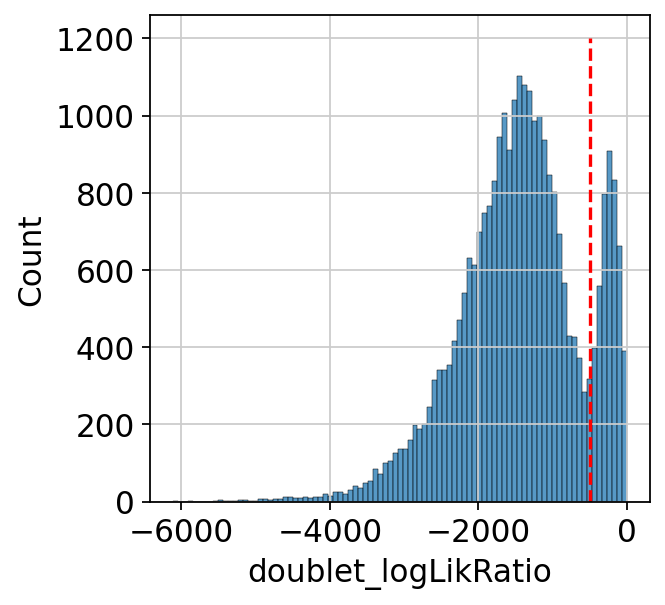

In [38]:
sns.histplot(x=ipsc_adata.obs['doublet_logLikRatio'])
plt.plot([doublet_nll_cutoff, doublet_nll_cutoff], [0, 1200], 'r--')

In [36]:
ipsc_filt = ipsc_adata[ipsc_adata.obs['doublet_logLikRatio'] <= doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

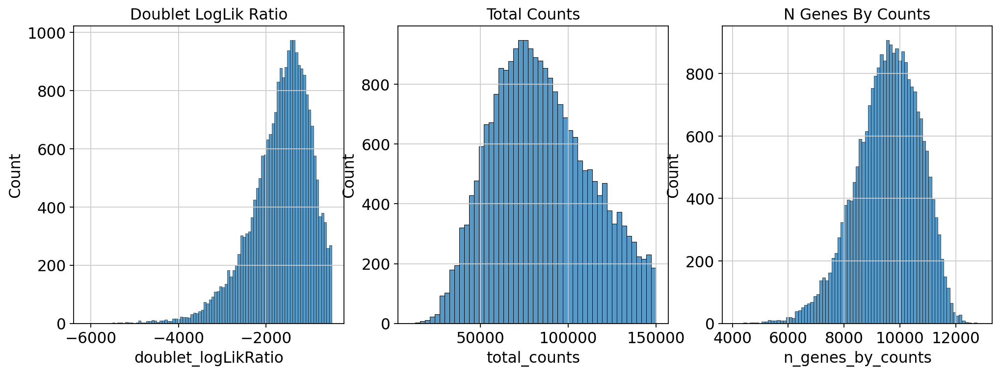

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=ipsc_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=ipsc_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=ipsc_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

#### Metrics related to cell viability

<AxesSubplot:xlabel='pct_counts_mt', ylabel='Count'>

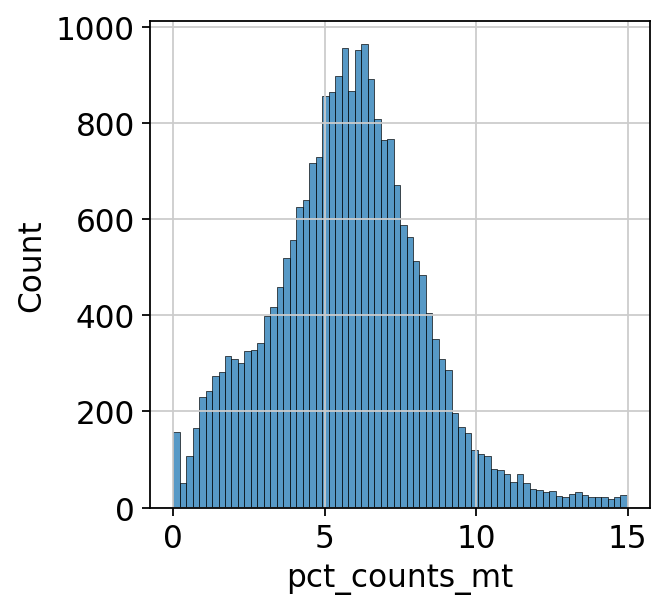

In [39]:
sns.histplot(ipsc_filt.obs['pct_counts_mt'])

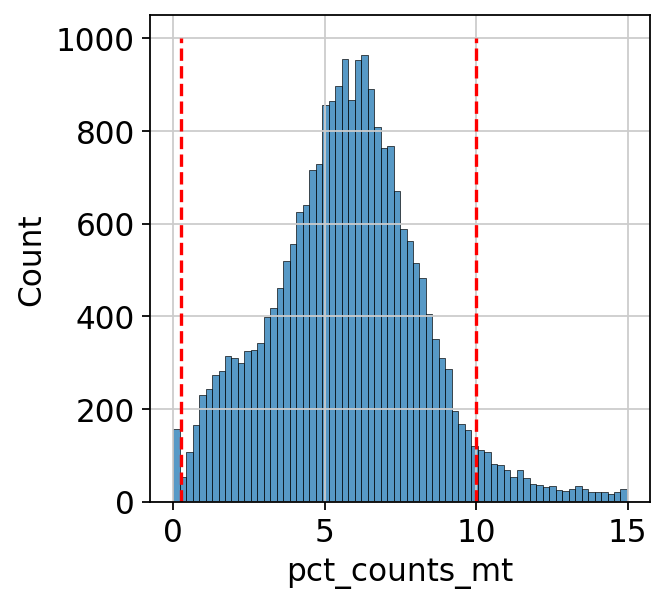

In [41]:
sns.histplot(ipsc_filt.obs['pct_counts_mt'])
plt.plot([0.25, 0.25], [0, 1000], 'r--')
plt.plot([10, 10], [0, 1000], 'r--')

In [42]:
ipsc_filt = ipsc_filt[(ipsc_filt.obs['pct_counts_mt'] >= 0.25) & (ipsc_filt.obs['pct_counts_mt'] < 10)]

#### Metrics related to expression patterns

In [43]:
sc.pp.highly_variable_genes(ipsc_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
ipsc_filt.X = ipsc_filt.layers['data']
sc.pp.scale(ipsc_filt)
ipsc_filt.layers['scaled'] = ipsc_filt.X

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [45]:
sc.tl.score_genes(ipsc_filt, gene_list=pluripotency_genes, score_name='pluripotency_score')

computing score 'pluripotency_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'pluripotency_score', score of gene set (adata.obs).
    350 total control genes are used. (0:00:04)


<AxesSubplot:xlabel='pluripotency_score', ylabel='Count'>

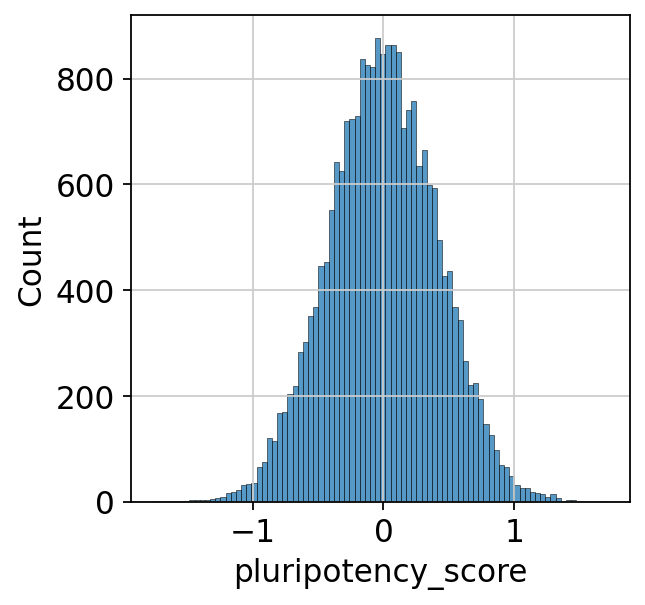

In [46]:
sns.histplot(ipsc_filt.obs['pluripotency_score'])

In [50]:
sc.tl.score_genes_cell_cycle(ipsc_filt, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    559 total control genes are used. (0:00:04)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    516 total control genes are used. (0:00:04)
-->     'phase', cell cycle phase (adata.obs)


Text(0.5, 1.0, 'G2M Score')

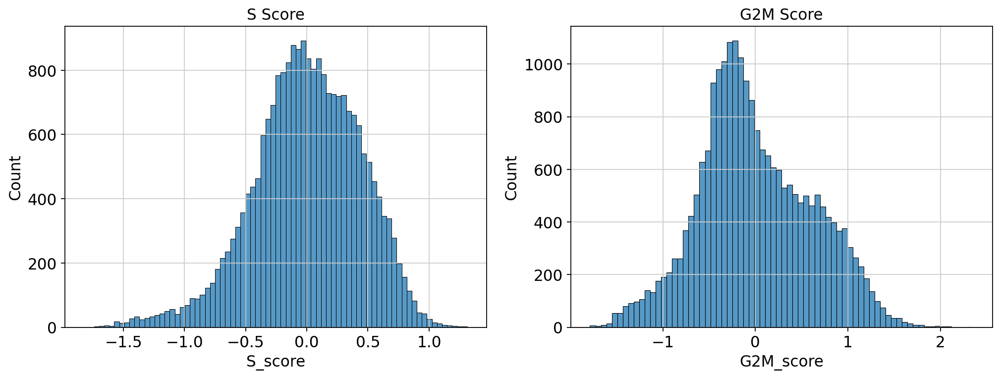

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=ipsc_filt.obs['S_score'])
axes[0].set_title('S Score')

sns.histplot(ax=axes[1], x=ipsc_filt.obs['G2M_score'])
axes[1].set_title('G2M Score')

#### Exploring expression variation

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


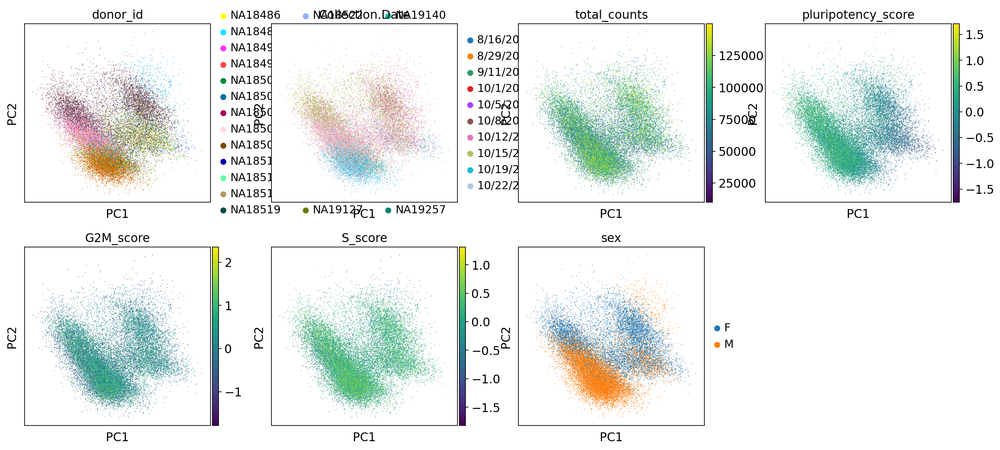

In [146]:
sc.pp.pca(ipsc_filt)
sc.pl.pca(ipsc_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'pluripotency_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

This is weird - does this structure appear in the UMAP embedding?

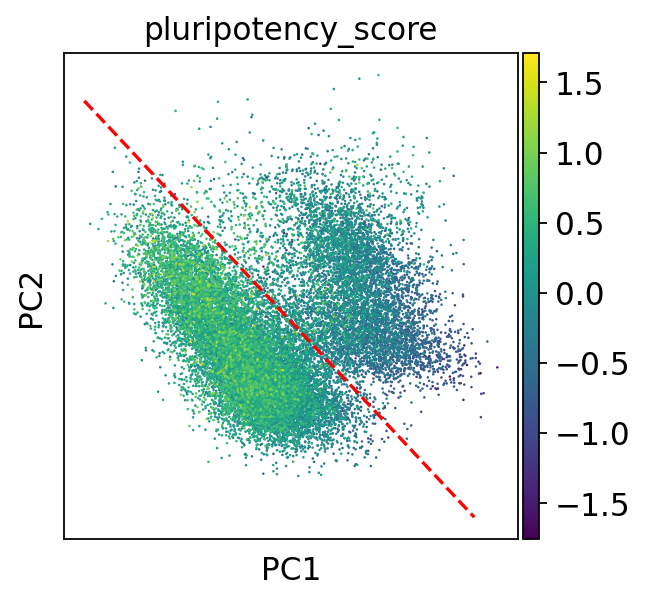

In [66]:
sc.pl.pca(ipsc_filt, color=['pluripotency_score'], return_fig=True)
plt.plot([-12, 12], [15, -12], 'r--')

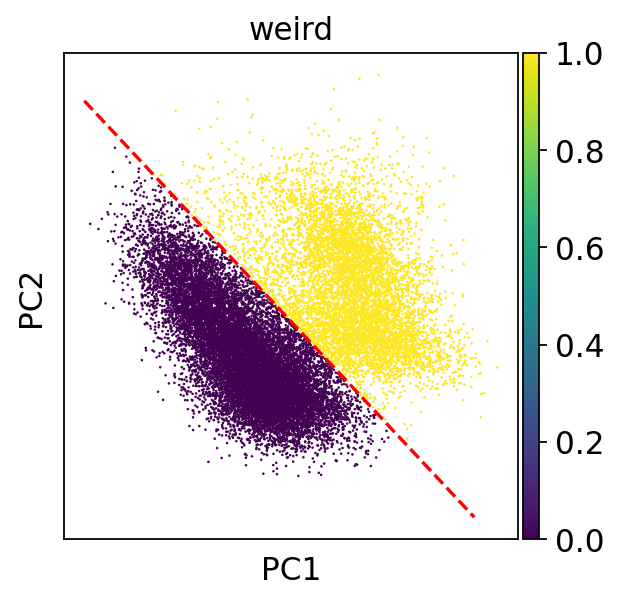

In [147]:
pc1 = ipsc_filt.obsm['X_pca'][:,0]
pc2 = ipsc_filt.obsm['X_pca'][:,1]
ipsc_filt.obs['weird'] = (pc2 > -9/8 * pc1 + 1.5).astype('int')
sc.pl.pca(ipsc_filt, color=['weird'], return_fig=True)
plt.plot([-12, 12], [15, -12], 'r--')

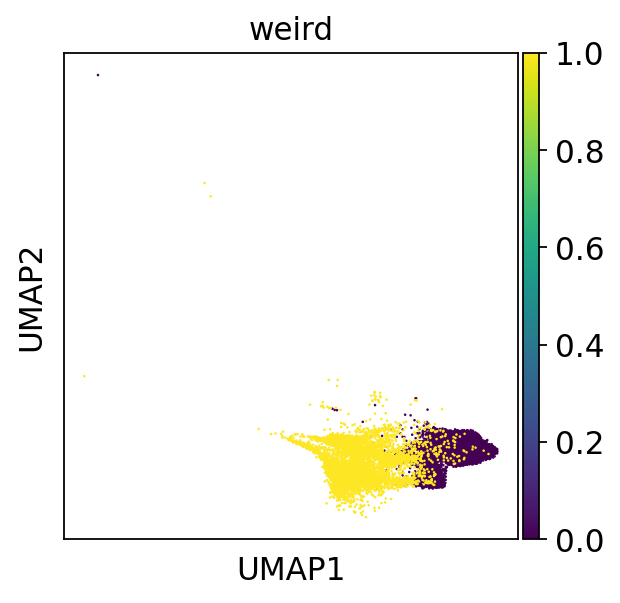

In [85]:
ipsc_filt.obsm['X_umap'] = radhika_adata[ipsc_filt.obs.index].obsm['X_umap']
sc.pl.umap(ipsc_filt, color='weird')

In [88]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'pluripotency_score', 'G2M_score', 'S_score']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if ipsc_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = ipsc_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = ipsc_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = ipsc_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

/tmp/jobs/23172908/ipykernel_172327/1224755203.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/1224755203.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/1224755203.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

#### Subset & save

In [98]:
ipsc_keepers = ipsc_filt.obs.index

In [97]:
ipsc_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage-ipsc.h5ad")

In [3]:
#ipsc_filt = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/ebqtl_ipsc.h5ad")

### Mesendoderm

In [99]:
mesendo_adata = scran_adata[scran_adata.obs['stage'] == 'mesendo']

#### Metrics related to cell depth

In [105]:
doublet_nll_cutoff = -700

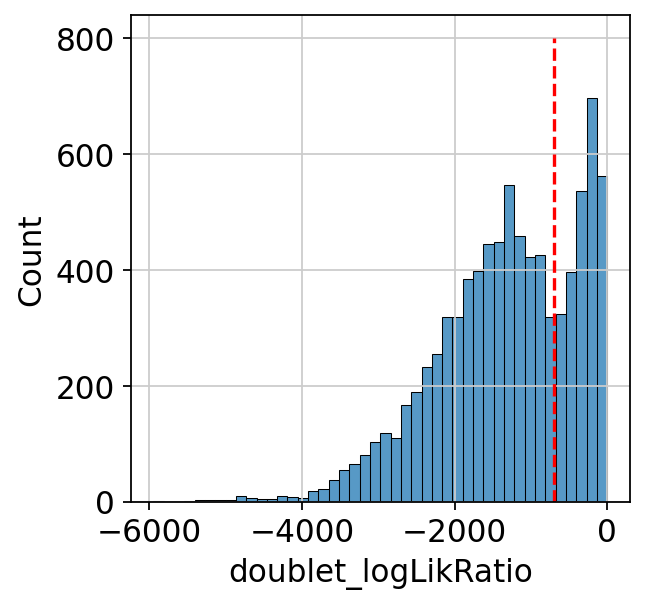

In [106]:
sns.histplot(x=mesendo_adata.obs['doublet_logLikRatio'])
plt.plot([doublet_nll_cutoff, doublet_nll_cutoff], [0, 800], 'r--')

In [107]:
mesendo_filt = mesendo_adata[mesendo_adata.obs['doublet_logLikRatio'] <= doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

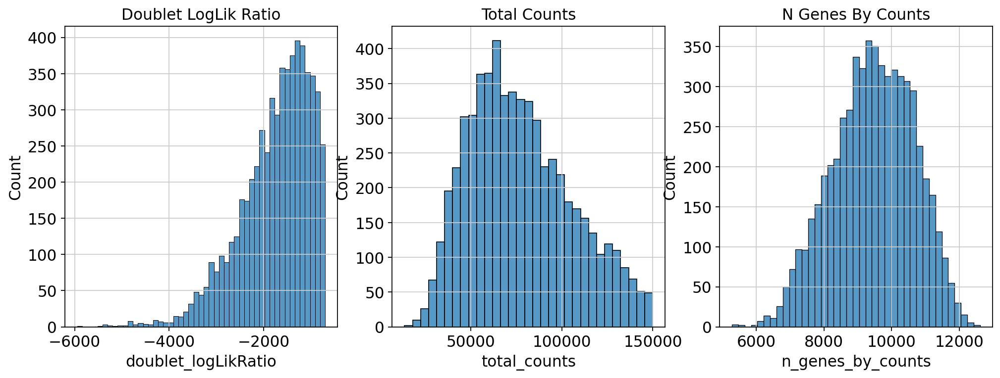

In [108]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=mesendo_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=mesendo_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=mesendo_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

#### Metrics related to cell viability

<AxesSubplot:xlabel='pct_counts_mt', ylabel='Count'>

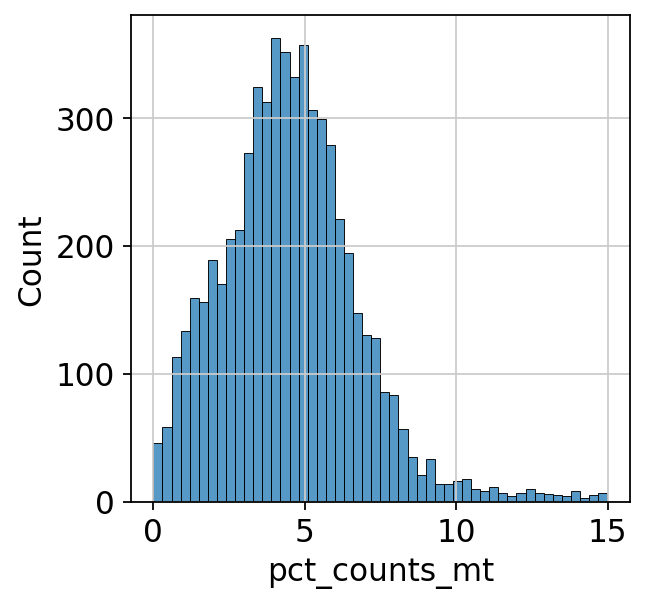

In [109]:
sns.histplot(mesendo_filt.obs['pct_counts_mt'])

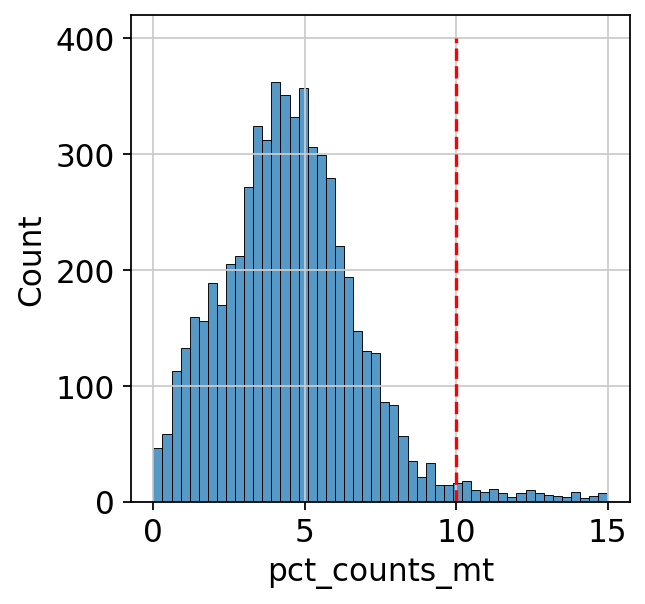

In [114]:
sns.histplot(mesendo_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [115]:
mesendo_filt = mesendo_filt[mesendo_filt.obs['pct_counts_mt'] < 10]

#### Metrics related to expression patterns

In [116]:
sc.pp.highly_variable_genes(mesendo_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
mesendo_filt.X = mesendo_filt.layers['data']
sc.pp.scale(mesendo_filt)
mesendo_filt.layers['scaled'] = mesendo_filt.X
sc.tl.score_genes(mesendo_filt, gene_list=mesendo_genes, score_name='mesendo_score')
sc.tl.score_genes_cell_cycle(mesendo_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


Text(0.5, 1.0, 'G2M Score')

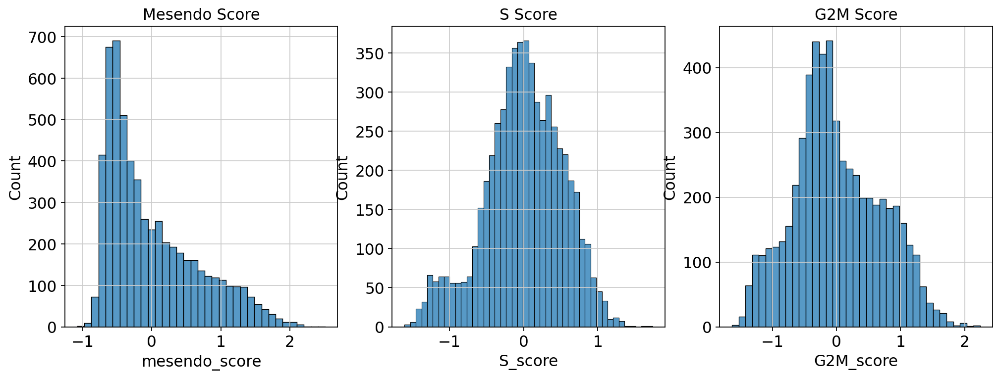

In [141]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=mesendo_filt.obs['mesendo_score'])
axes[0].set_title('Mesendo Score')

sns.histplot(ax=axes[1], x=mesendo_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=mesendo_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

#### Exploring expression patterns

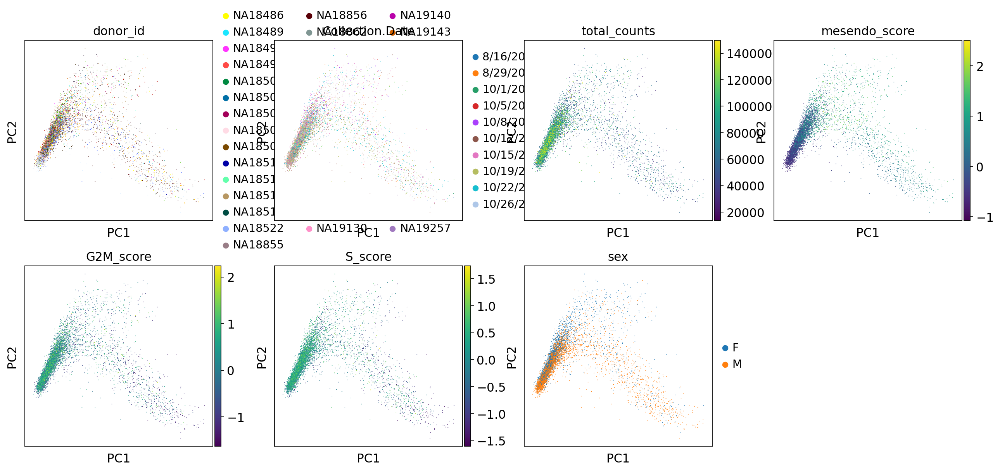

In [125]:
sc.pp.pca(mesendo_filt)
sc.pl.pca(mesendo_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'mesendo_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_172327/3803786710.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/3803786710.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/3803786710.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'mesendo_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score')])

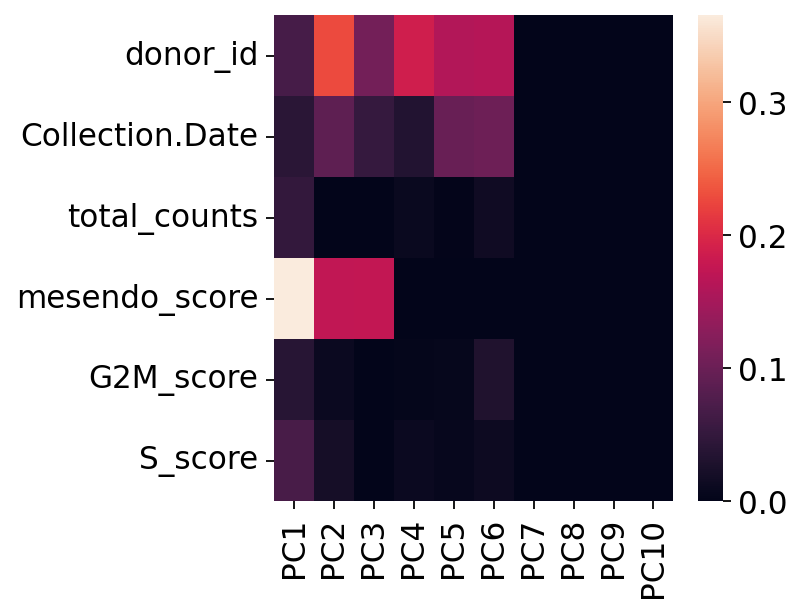

In [126]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'mesendo_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if mesendo_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = mesendo_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = mesendo_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = mesendo_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

#### Subset & save

In [183]:
mesendo_keepers = mesendo_filt.obs.index

In [184]:
mesendo_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage-mesendo.h5ad")

### Mesoderm

In [127]:
meso_adata = scran_adata[scran_adata.obs['stage'] == 'meso']

#### Metrics related to cell depth

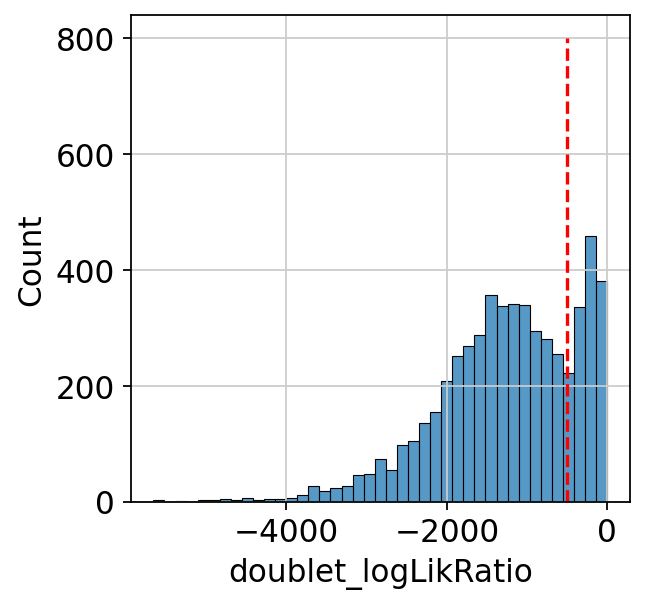

In [130]:
doublet_nll_cutoff = -500
sns.histplot(x=meso_adata.obs['doublet_logLikRatio'])
plt.plot([doublet_nll_cutoff, doublet_nll_cutoff], [0, 800], 'r--')

In [131]:
meso_filt = meso_adata[meso_adata.obs['doublet_logLikRatio'] <= doublet_nll_cutoff]

Text(0.5, 1.0, 'N Genes By Counts')

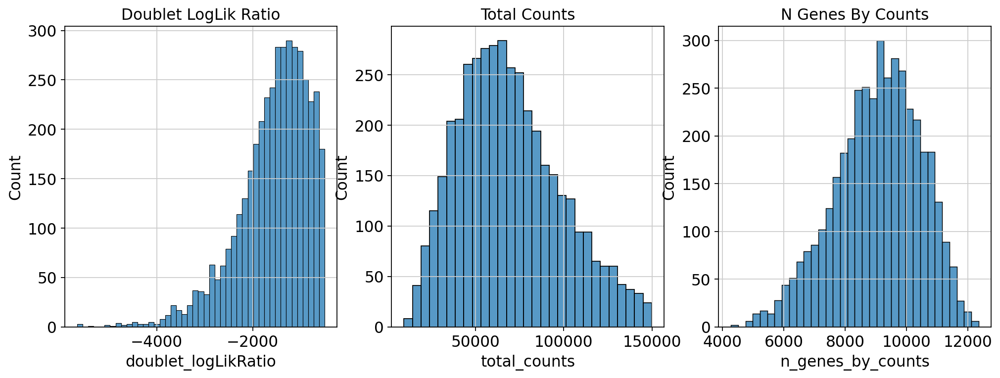

In [132]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=meso_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=meso_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=meso_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

#### Metrics related to cell viability

<AxesSubplot:xlabel='pct_counts_mt', ylabel='Count'>

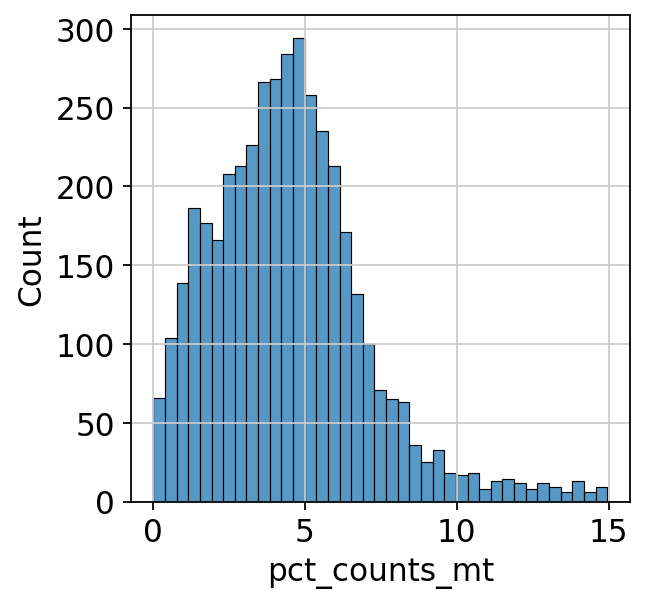

In [133]:
sns.histplot(meso_filt.obs['pct_counts_mt'])

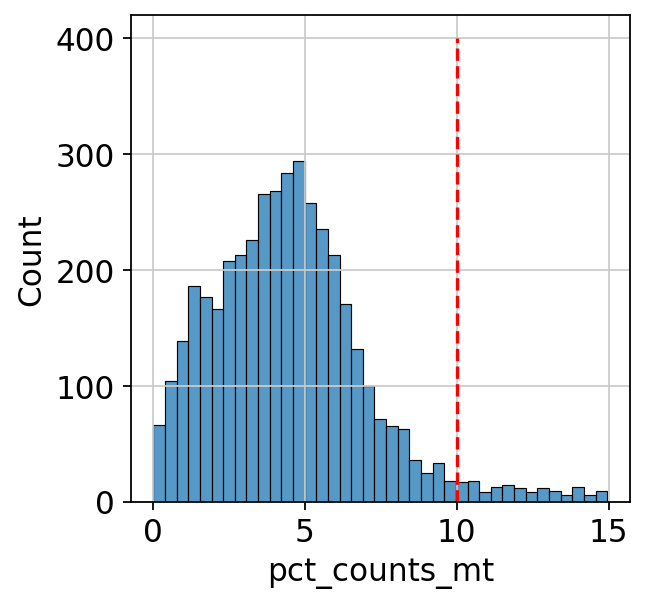

In [134]:
sns.histplot(meso_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [135]:
meso_filt = meso_filt[meso_filt.obs['pct_counts_mt'] < 10]

#### Metrics related to expression patterns

In [137]:
sc.pp.highly_variable_genes(meso_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
meso_filt.X = meso_filt.layers['data']
sc.pp.scale(meso_filt)
meso_filt.layers['scaled'] = meso_filt.X
sc.tl.score_genes(meso_filt, gene_list=mesoderm_genes, score_name='meso_score')
sc.tl.score_genes_cell_cycle(meso_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'meso_score'
    finished: added
    'meso_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    558 total control genes are used. (0:00:00)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    515 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

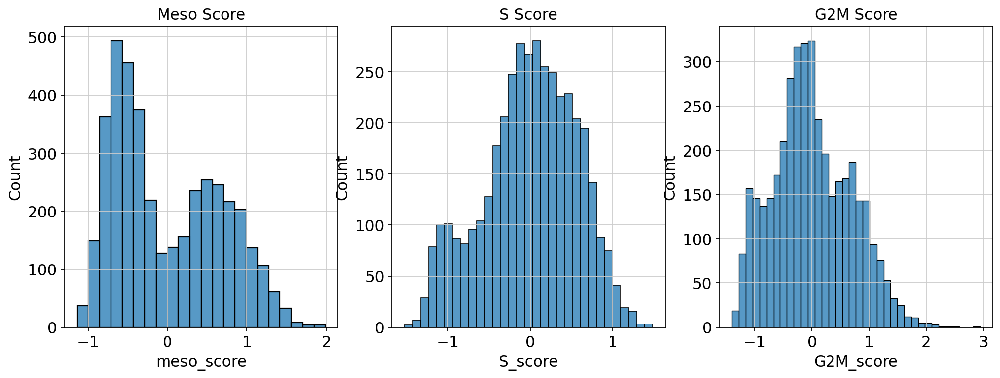

In [139]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=meso_filt.obs['meso_score'])
axes[0].set_title('Meso Score')

sns.histplot(ax=axes[1], x=meso_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=meso_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

#### Exploring expression patterns

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


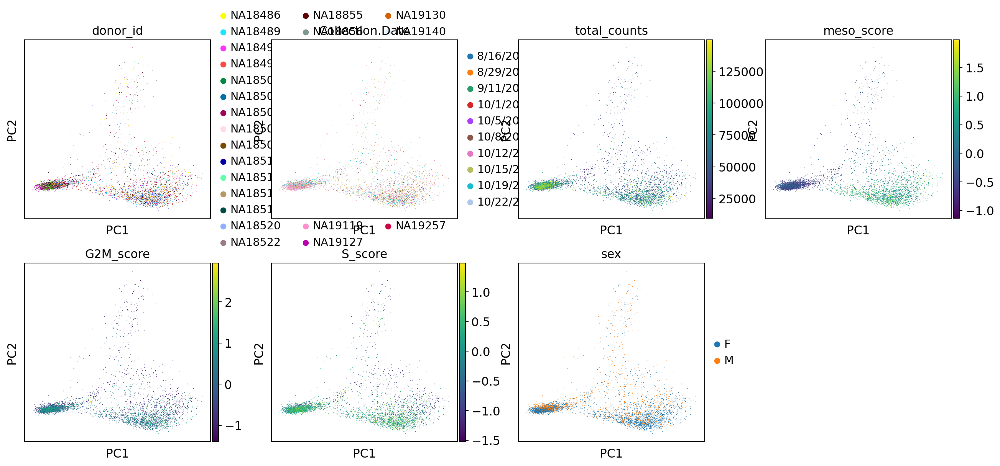

In [143]:
sc.pp.pca(meso_filt)
sc.pl.pca(meso_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'meso_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_172327/1070461383.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/1070461383.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/1070461383.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'meso_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

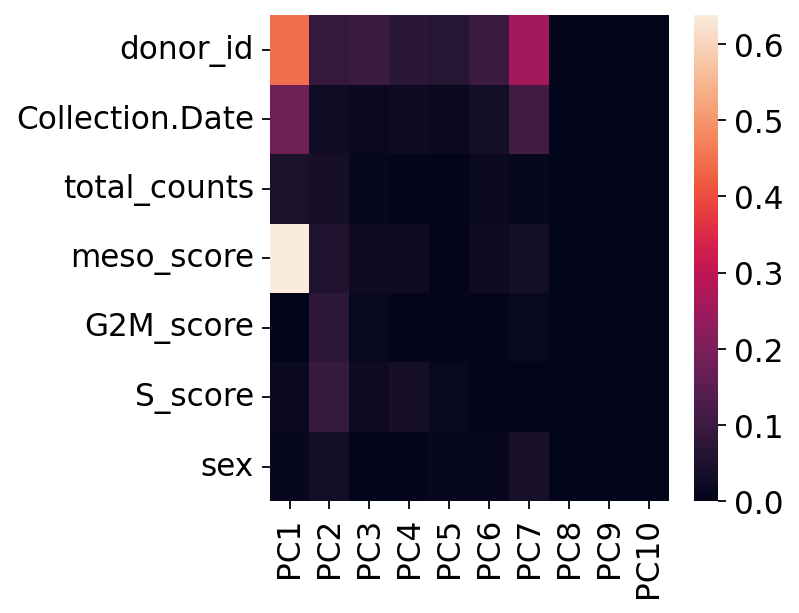

In [145]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'meso_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if meso_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = meso_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = meso_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = meso_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

#### Subset & save

In [185]:
meso_keepers = meso_filt.obs.index

In [186]:
meso_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage-meso.h5ad")

### Cardiac Progenitor

In [148]:
cp_adata = scran_adata[scran_adata.obs['stage'] == 'cp']

#### Metrics related to cell depth

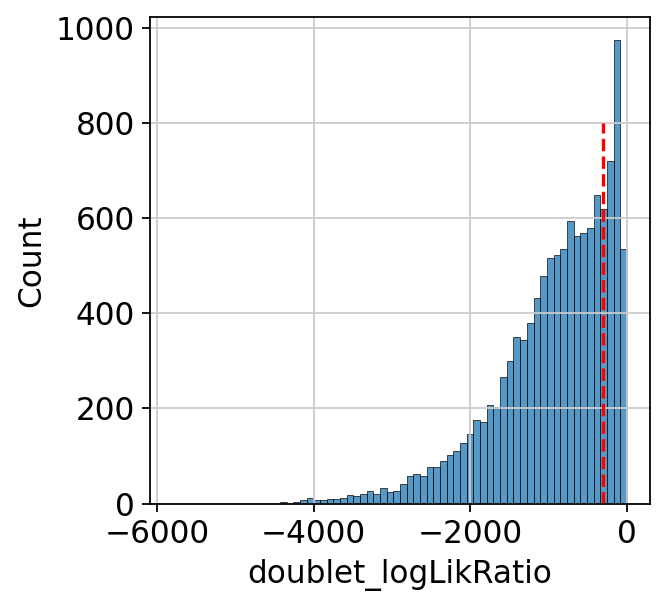

In [151]:
doublet_nll_cutoff = -300
sns.histplot(x=cp_adata.obs['doublet_logLikRatio'])
plt.plot([doublet_nll_cutoff, doublet_nll_cutoff], [0, 800], 'r--')

Text(0.5, 1.0, 'N Genes By Counts')

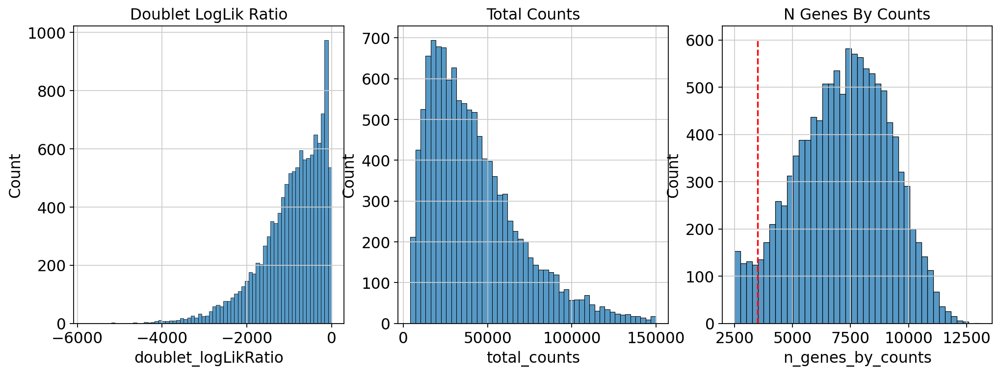

In [156]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_adata.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cp_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cp_adata.obs['n_genes_by_counts'])
plt.plot([3500, 3500], [0, 600], 'r--')
axes[2].set_title('N Genes By Counts')

In [159]:
cp_filt = cp_adata[cp_adata.obs['n_genes_by_counts'] >= 3500]

Text(0.5, 1.0, 'N Genes By Counts')

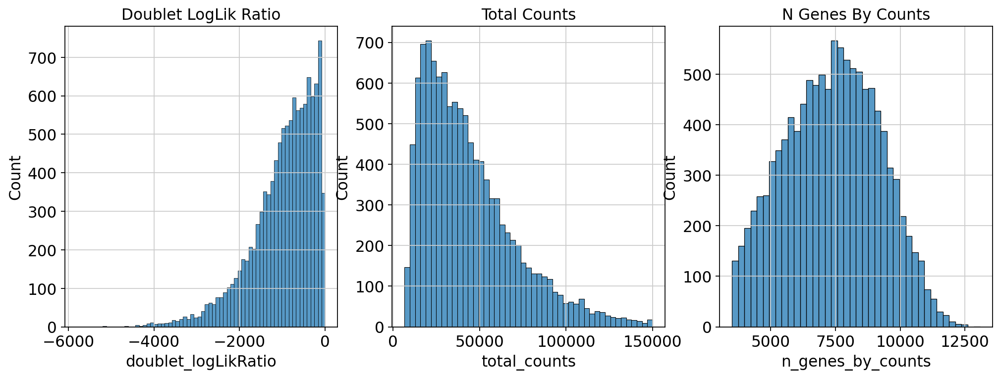

In [160]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_filt.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cp_filt.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cp_filt.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

#### Metrics related to cell viability

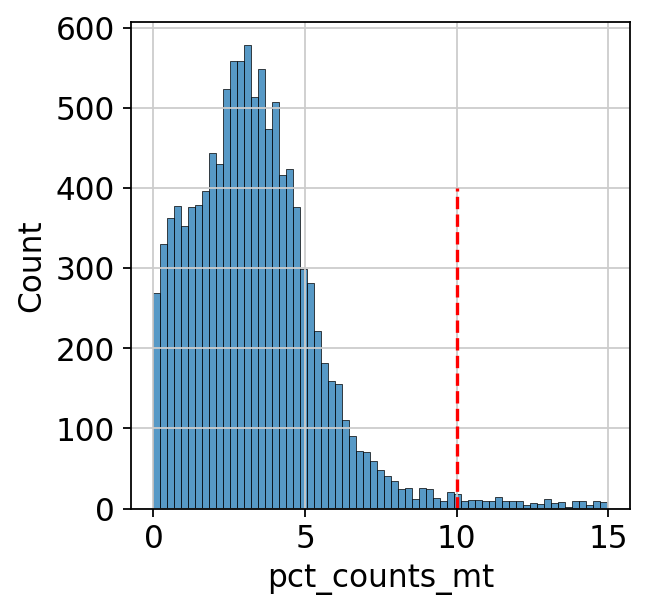

In [162]:
sns.histplot(cp_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 400], 'r--')

In [163]:
cp_filt = cp_filt[cp_filt.obs['pct_counts_mt'] < 10]

#### Metrics related to expression patterns

In [164]:
sc.pp.highly_variable_genes(cp_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
cp_filt.X = cp_filt.layers['data']
sc.pp.scale(cp_filt)
cp_filt.layers['scaled'] = cp_filt.X
sc.tl.score_genes(cp_filt, gene_list=progenitor_genes, score_name='cp_score')
sc.tl.score_genes_cell_cycle(cp_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'cp_score'
    finished: added
    'cp_score', score of gene set (adata.obs).
    350 total control genes are used. (0:00:02)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    987 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    772 total control genes are used. (0:00:02)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


-->     'phase', cell cycle phase (adata.obs)


Text(0.5, 1.0, 'G2M Score')

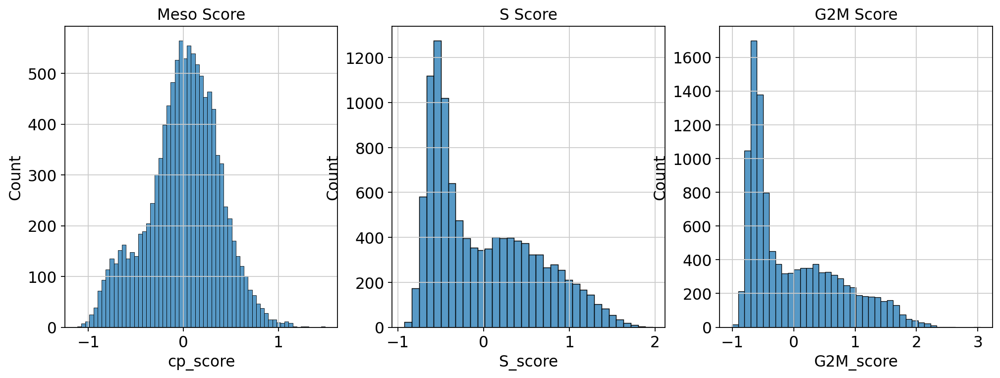

In [165]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cp_filt.obs['cp_score'])
axes[0].set_title('CP Score')

sns.histplot(ax=axes[1], x=cp_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=cp_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

#### Exploring expression patterns

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


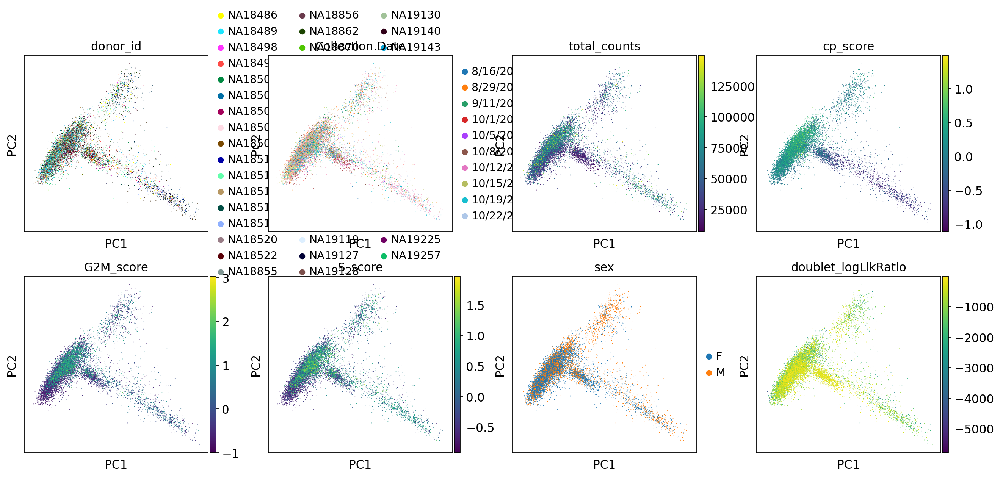

In [227]:
sc.pp.pca(cp_filt)
sc.pl.pca(cp_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex',
                         'doublet_logLikRatio'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_172327/2113794150.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/2113794150.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/2113794150.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'cp_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

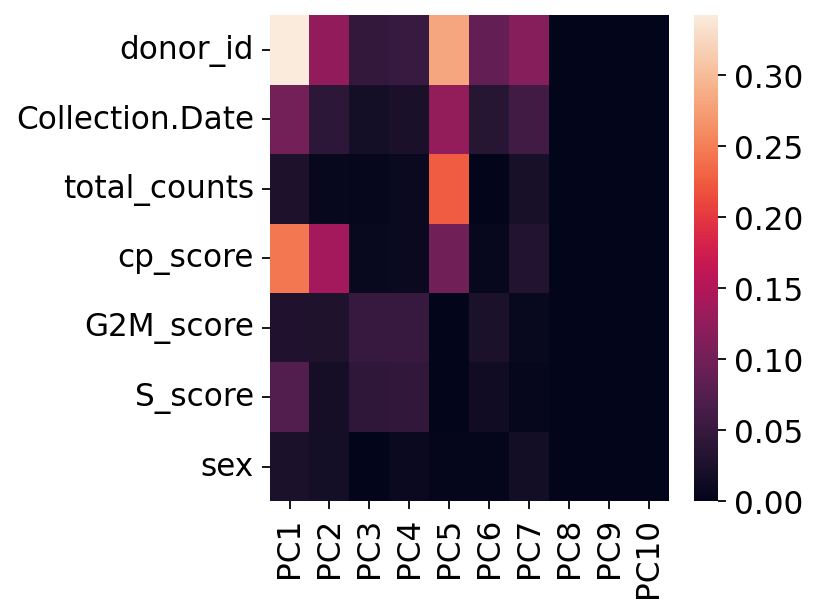

In [169]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'cp_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if cp_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = cp_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = cp_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = cp_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

#### Subset & save

In [187]:
cp_keepers = cp_filt.obs.index

In [188]:
cp_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage-cp.h5ad")

### Cardiomyocytes

In [170]:
cm_adata = scran_adata[scran_adata.obs['stage'] == 'cm']

#### Metrics related to cell depth

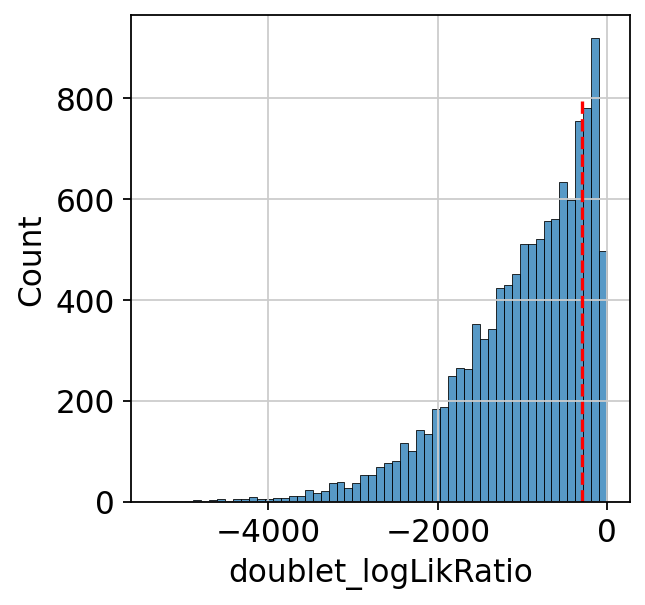

In [171]:
doublet_nll_cutoff = -300
sns.histplot(x=cm_adata.obs['doublet_logLikRatio'])
plt.plot([doublet_nll_cutoff, doublet_nll_cutoff], [0, 800], 'r--')

Text(0.5, 1.0, 'N Genes By Counts')

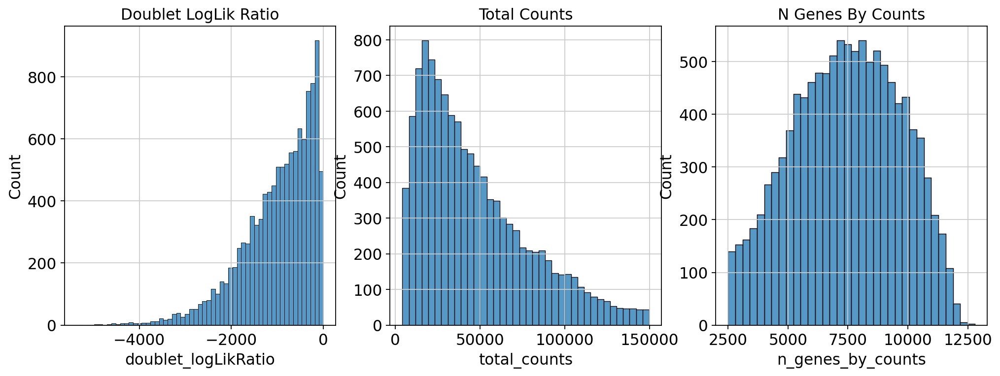

In [173]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cm_adata.obs['doublet_logLikRatio'])
axes[0].set_title('Doublet LogLik Ratio')

sns.histplot(ax=axes[1], x=cm_adata.obs['total_counts'])
axes[1].set_title('Total Counts')

sns.histplot(ax=axes[2], x=cm_adata.obs['n_genes_by_counts'])
axes[2].set_title('N Genes By Counts')

No clear line to draw here!

In [174]:
cm_filt = cm_adata

#### Metrics related to cell viability

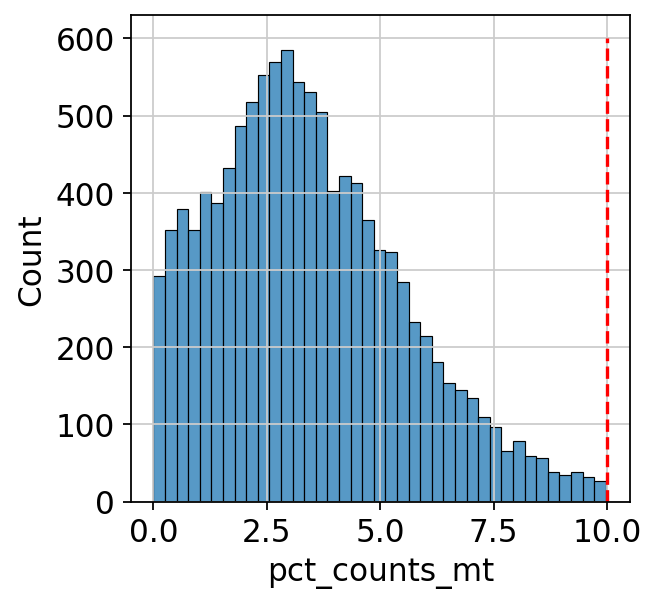

In [177]:
sns.histplot(cm_filt.obs['pct_counts_mt'])
plt.plot([10, 10], [0, 600], 'r--')

In [176]:
cm_filt = cm_filt[cm_filt.obs['pct_counts_mt'] < 10]

#### Metrics related to expression patterns

In [178]:
sc.pp.highly_variable_genes(cm_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
cm_filt.X = cm_filt.layers['data']
sc.pp.scale(cm_filt)
cm_filt.layers['scaled'] = cm_filt.X
sc.tl.score_genes(cm_filt, gene_list=cardiomyocyte_genes, score_name='cm_score')
sc.tl.score_genes_cell_cycle(cm_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'cm_score'
    finished: added
    'cm_score', score of gene set (adata.obs).
    499 total control genes are used. (0:00:02)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    860 total control genes are used. (0:00:02)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    687 total control genes are used. (0:00:02)
-->     'phase', cell cycle phase (adata.obs)


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


Text(0.5, 1.0, 'G2M Score')

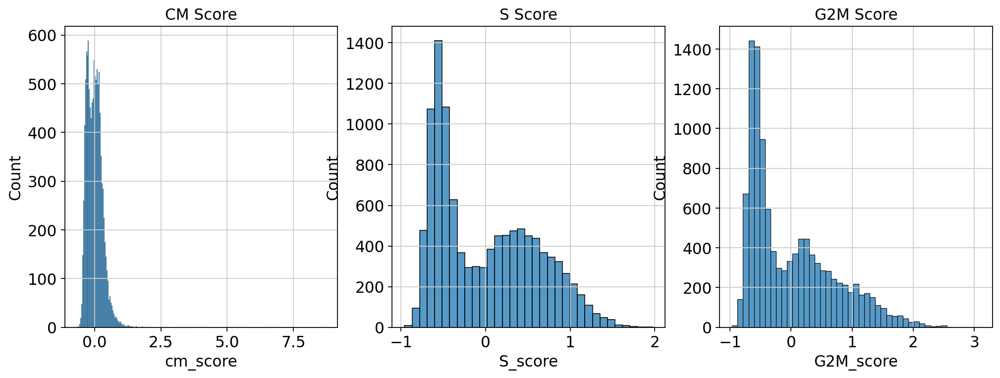

In [180]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=False)

sns.histplot(ax=axes[0], x=cm_filt.obs['cm_score'])
axes[0].set_title('CM Score')

sns.histplot(ax=axes[1], x=cm_filt.obs['S_score'])
axes[1].set_title('S Score')

sns.histplot(ax=axes[2], x=cm_filt.obs['G2M_score'])
axes[2].set_title('G2M Score')

#### Exploring expression patterns

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


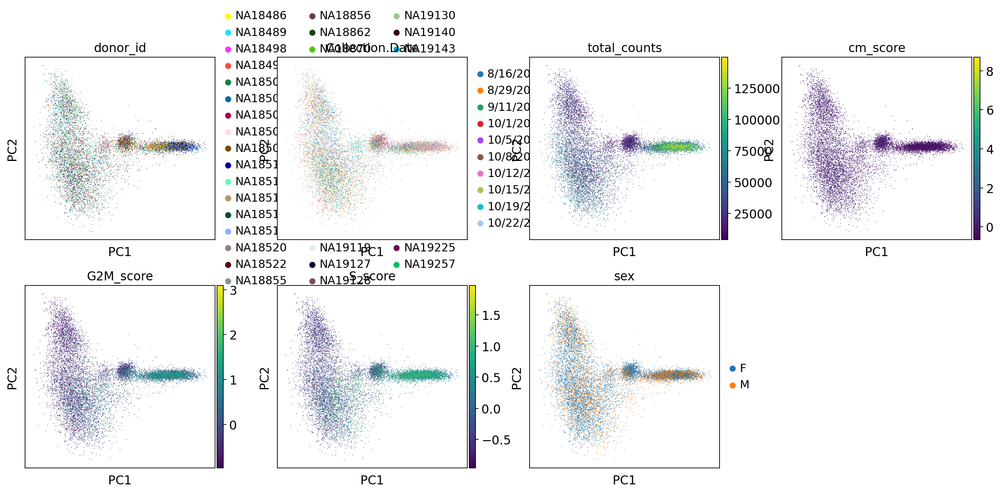

In [181]:
sc.pp.pca(cm_filt)
sc.pl.pca(cm_filt, color=['donor_id', 'Collection.Date', 'total_counts', 'cm_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

/tmp/jobs/23172908/ipykernel_172327/2217238916.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/2217238916.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_pd['intercept'] = 1
/tmp/jobs/23172908/ipykernel_172327/2217238916.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5]),
 [Text(0, 0.5, 'donor_id'),
  Text(0, 1.5, 'Collection.Date'),
  Text(0, 2.5, 'total_counts'),
  Text(0, 3.5, 'cm_score'),
  Text(0, 4.5, 'G2M_score'),
  Text(0, 5.5, 'S_score'),
  Text(0, 6.5, 'sex')])

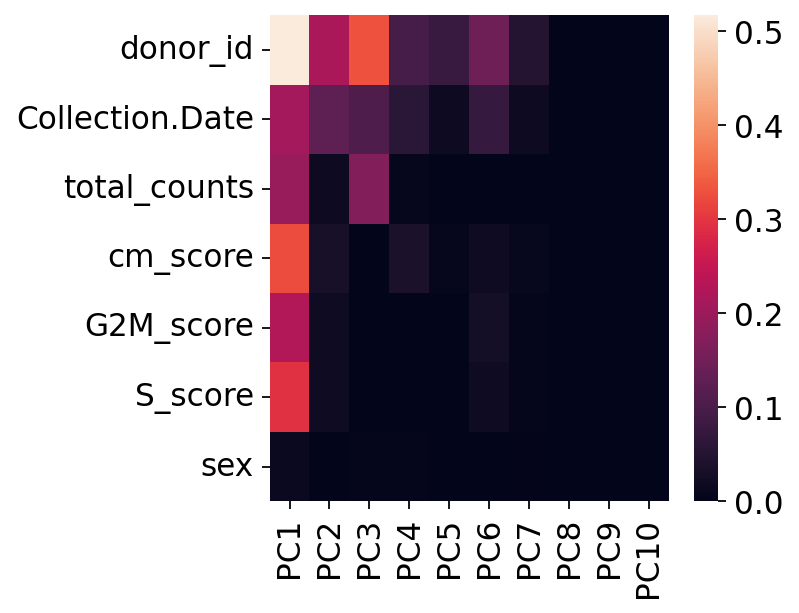

In [182]:
covariates = ['donor_id', 'Collection.Date', 'total_counts', 'cm_score', 'G2M_score', 'S_score', 'sex']
mat = np.zeros([len(covariates), 10])
for k in range(len(covariates)):
    if cm_filt.obs[covariates[k]].dtype.name == 'category':
        X_pd = cm_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = OneHotEncoder().fit(X_pd).transform(X_pd)
    else:
        X_pd = cm_filt.obs[[covariates[k]]]
        X_pd['intercept'] = 1
        X = X_pd.to_numpy()
    for pc in range(len(covariates)):
        y = cm_filt.obsm['X_pca'][:, pc]
        r2 = LinearRegression().fit(X, y).score(X, y)
        mat[k, pc] = r2
sns.heatmap(mat,
            xticklabels=['PC' + str(i) for i in range(1, 11)],
            yticklabels=covariates)
plt.yticks(rotation=0)

#### Subset & save

In [189]:
cm_keepers = cm_filt.obs.index

In [190]:
cm_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage-cm.h5ad")

## Full lineage analysis

In [192]:
all_keepers = ipsc_keepers.union(mesendo_keepers).union(meso_keepers).union(cp_keepers).union(cm_keepers)

In [193]:
scran_adata_filt = scran_adata[all_keepers]

#### Exploring expression patterns

In [195]:
sc.pp.highly_variable_genes(scran_adata_filt, layer='counts', n_top_genes=1000, flavor='seurat_v3', subset=False)
scran_adata_filt.X = scran_adata_filt.layers['data']
sc.pp.scale(scran_adata_filt)
scran_adata_filt.layers['scaled'] = scran_adata_filt.X
sc.tl.score_genes(scran_adata_filt, gene_list=pluripotency_genes, score_name='pluripotency_score')
sc.tl.score_genes(scran_adata_filt, gene_list=cardiomyocyte_genes, score_name='cm_score')
sc.tl.score_genes_cell_cycle(scran_adata_filt, s_genes=s_genes, g2m_genes=g2m_genes)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/contextlib.py:126: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing score 'pluripotency_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'pluripotency_score', score of gene set (adata.obs).
    450 total control genes are used. (0:00:10)
computing score 'cm_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'cm_score', score of gene set (adata.obs).
    548 total control genes are used. (0:00:10)
calculating cell cycle phase
computing score 'S_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    644 total control genes are used. (0:00:10)
computing score 'G2M_score'


/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    771 total control genes are used. (0:00:10)
-->     'phase', cell cycle phase (adata.obs)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


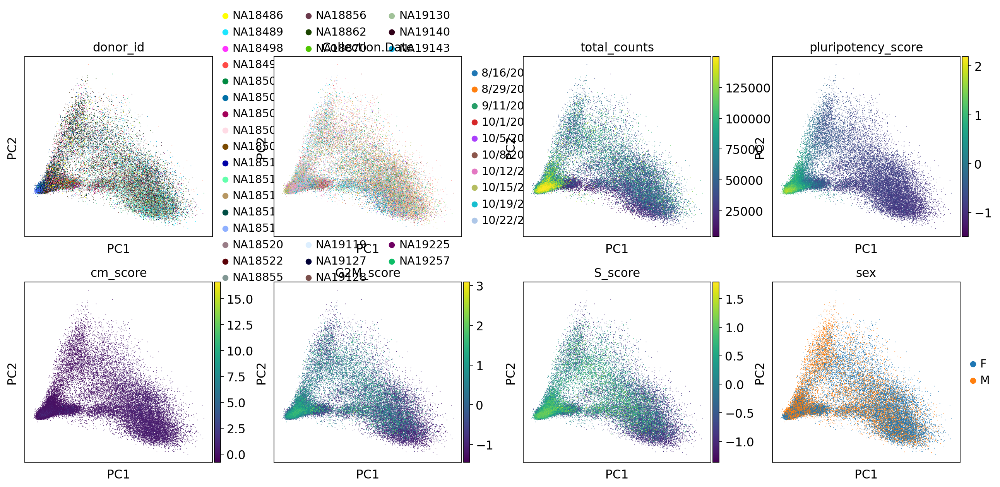

In [196]:
sc.pp.pca(scran_adata_filt)
sc.pl.pca(scran_adata_filt, color=['donor_id', 'Collection.Date', 'total_counts', 
                                   'pluripotency_score', 'cm_score', 'G2M_score', 'S_score', 'sex'],
         size=2.5, edgecolor='none')

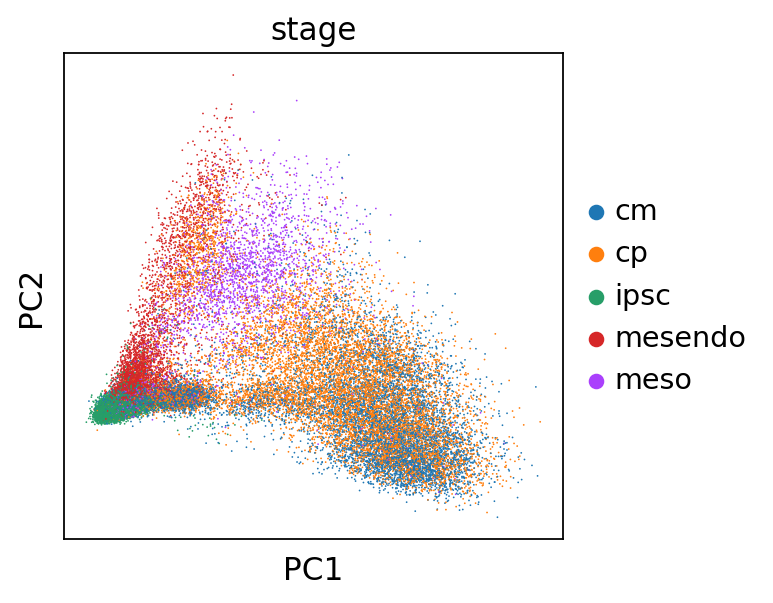

In [226]:
sc.pl.pca(scran_adata_filt, color=['stage'],
         size=2.5, edgecolor='none')

In [201]:
scran_adata_filt.obs['log_cm_score'] = np.log(scran_adata_filt.obs['cm_score']+1)

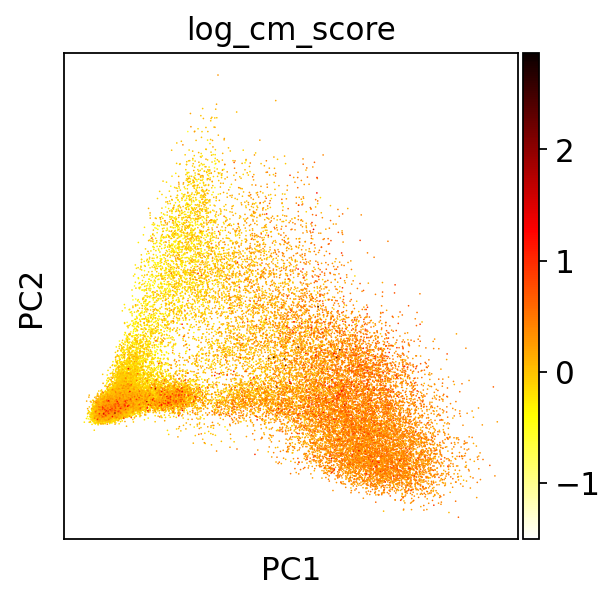

In [202]:
sc.pl.pca(scran_adata_filt, color=['log_cm_score'], color_map='hot_r')

#### Pseudotime inference

In [10]:
sc.pp.neighbors(scran_adata_filt)
sc.tl.diffmap(scran_adata_filt)
scran_adata_filt.uns['iroot'] = np.argmax(scran_adata_filt.X[:, list(scran_adata_filt.var_names).index("POU5F1")])
sc.tl.dpt(scran_adata_filt)

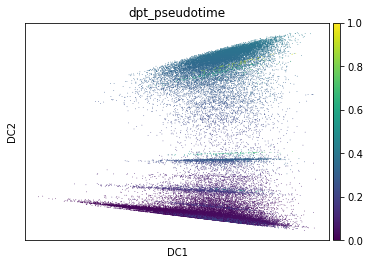

In [12]:
sc.pl.diffmap(scran_adata_filt, color='dpt_pseudotime')

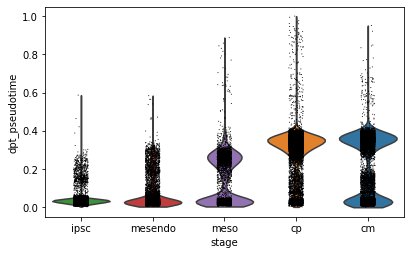

In [14]:
sc.pl.violin(scran_adata_filt, keys='dpt_pseudotime', groupby='stage', order=['ipsc', 'mesendo', 'meso', 'cp', 'cm'])

#### Subset & save

In [204]:
scran_adata_filt.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage.h5ad")

In [3]:
scran_adata_filt = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cm_lineage.h5ad")

## Update summary tables

In [211]:
filtered_counts = scran_adata_filt.obs[['donor_id', 'stage', 'total_counts', 'pluripotency_score', 'log_cm_score']]
filtered_counts['n_cells_filtered'] = 1
filtered_counts['individual'] = [s.replace("NA", "") for s in filtered_counts['donor_id']]
filtered_counts['ind_type'] = filtered_counts['individual'].astype(str) + "_" + filtered_counts['stage'].astype(str)
filtered_counts = filtered_counts.drop(columns=['donor_id', 'individual', 'stage'])
filtered_counts = filtered_counts.groupby('ind_type').agg({'total_counts': 'sum', 'n_cells_filtered': 'count', 
                                                           'pluripotency_score': 'median', 'log_cm_score': 'median'})
filtered_counts = filtered_counts.reset_index().astype({'total_counts': 'int'})
filtered_counts

/tmp/jobs/23172908/ipykernel_172327/2294190162.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_counts['n_cells_filtered'] = 1
/tmp/jobs/23172908/ipykernel_172327/2294190162.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_counts['individual'] = [s.replace("NA", "") for s in filtered_counts['donor_id']]
/tmp/jobs/23172908/ipykernel_172327/2294190162.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

,ind_type,total_counts,n_cells_filtered,pluripotency_score,log_cm_score
0,18486_cm,23987135,366,-0.029821,-0.048014
1,18486_cp,10387494,212,-0.699881,-0.026251
2,18486_ipsc,56870335,831,0.471009,-0.200336
3,18486_mesendo,16977111,247,0.078268,-0.175090
4,18486_meso,9406838,149,-0.138007,-0.169961
...,...,...,...,...,...
221,19257_cm,4676321,146,-0.619330,0.246327
222,19257_cp,5298821,145,-0.659815,0.076086
223,19257_ipsc,134749,2,0.061647,-0.446022
224,19257_mesendo,701877,11,-0.112110,-0.339471


In [222]:
cell_counts_filtered = cell_counts.merge(filtered_counts, on='ind_type', how='left').fillna({'total_counts': 0, 'n_cells_filtered': 0, 'pluripotency_score': 0, 'log_cm_score': 0}).astype({'total_counts': 'int', 'n_cells_filtered': 'int'})
cell_counts_filtered['dropped'] = cell_counts_filtered['n_cells_filtered'] < 5
cell_counts_filtered = cell_counts_filtered.sort_values(by="n_cells_filtered", ascending=False)

In [225]:
cell_counts_filtered.to_csv("/project2/gilad/jpopp/ebQTL/data/static/cm_lineage/pseudobulk_scran/sample_summary.tsv", sep="\t")
cell_counts_filtered.to_csv("/project2/gilad/jpopp/ebQTL/data/static/cm_lineage/pseudobulk_tmm/sample_summary.tsv", sep="\t")

In [4]:
#cell_counts_filtered = pd.read_csv("/project2/gilad/jpopp/ebQTL/data/static/ebqtl_ipsc/pseudobulk-scran/sample_summary_filtered.tsv", sep="\t")

## Aggregation

### Aggregate raw counts by stage

In [228]:
cell_subset = scran_adata_filt.obs[['donor_id']]
cell_subset['type'] = scran_adata_filt.obs[['stage']]
cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
cell_subset['sample'] = cell_subset['ind'] + "_" + cell_subset['type']
onehot = OneHotEncoder(sparse=True).fit_transform(cell_subset[['sample']])
onehot

/tmp/jobs/23172908/ipykernel_172327/3815065843.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['type'] = scran_adata_filt.obs[['stage']]
/tmp/jobs/23172908/ipykernel_172327/3815065843.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cell_subset['ind'] = [s.replace("NA", "") for s in cell_subset['donor_id'].astype(str)]
/tmp/jobs/23172908/ipykernel_172327/3815065843.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,

<54812x226 sparse matrix of type '<class 'numpy.float64'>'
	with 54812 stored elements in Compressed Sparse Row format>

In [229]:
pseudobulk_sum = scran_adata_filt.layers['counts'].transpose() * onehot

In [230]:
pseudobulk_sum = pd.DataFrame(pseudobulk_sum, index=scran_adata_filt.var_names, columns=cell_subset['sample'].astype("category").cat.categories)

In [231]:
pseudobulk_sum.to_csv("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/cm_lineage.pseudobulk_tmm.tsv",
                       sep="\t", index_label="gene")

### Aggregate scran-normalized counts by stage

In [232]:
n_cells = onehot.sum(axis=0)
pseudobulk_sum_norm = scran_adata_filt.layers['data'].transpose() * onehot
pseudobulk_mean_norm = pseudobulk_sum_norm / n_cells

In [233]:
pseudobulk_mean_norm = pd.DataFrame(pseudobulk_mean_norm, 
                                    index=scran_adata_filt.var_names, columns=cell_subset['sample'].astype("category").cat.categories)

In [ ]:
pseudobulk_mean_norm.to_csv("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/cm_lineage.pseudobulk_scran.tsv",
                       sep="\t", index_label="gene")